**20L-0961**

# Part 1: Spoof Detection

In [ ]:
# Install required packages to download the dataset
!pip install -q datasets huggingface_hub pyarrow transformers torch torchvision tqdm wget

In [2]:
from huggingface_hub import login
login()

In [ ]:
import pytorch_lightning as pl
from pytorch_lightning.loggers import WandbLogger
from pytorch_lightning.callbacks import ModelCheckpoint
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import wandb
from datasets import load_dataset
import io
from PIL import Image
from transformers import ViTImageProcessor, ViTForImageClassification
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import numpy as np

# Custom Dataset class
class PreprocessedCelebaDataset(torch.utils.data.Dataset):
    def __init__(self, dataset):
        self.dataset = dataset

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        example = self.dataset[idx]
        pixel_values = torch.tensor(example["pixel_values"], dtype=torch.float32)
        label = torch.tensor(example["labels"], dtype=torch.long)
        return {"pixel_values": pixel_values, "labels": label}

# Lightning Module
class ViTSpoofDetector(pl.LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model
        self.save_hyperparameters()
        # Initialize lists to store validation outputs
        self.validation_step_outputs = []

    def forward(self, pixel_values):
        return self.model(pixel_values=pixel_values).logits

    def training_step(self, batch, batch_idx):
        outputs = self.model(pixel_values=batch["pixel_values"], labels=batch["labels"])
        loss = outputs.loss
        self.log("train_loss", loss)
        return loss



    def validation_step(self, batch, batch_idx):
        outputs = self.model(**batch)
        loss = outputs.loss
        preds = torch.argmax(outputs.logits, dim=1)

        self.validation_step_outputs.append({
            'val_loss': loss,
            'preds': preds,
            'labels': batch['labels']
        })
        return {'val_loss': loss, 'preds': preds, 'labels': batch['labels']}

    def on_validation_epoch_end(self):
        outputs = self.validation_step_outputs

        avg_loss = torch.stack([x['val_loss'] for x in outputs]).mean()
        preds = torch.cat([x['preds'] for x in outputs])
        labels = torch.cat([x['labels'] for x in outputs])

        acc = accuracy_score(labels.cpu(), preds.cpu())
        prec = precision_score(labels.cpu(), preds.cpu())
        rec = recall_score(labels.cpu(), preds.cpu())
        f1 = f1_score(labels.cpu(), preds.cpu())

        self.log('val_loss', avg_loss)
        self.log('val_acc', acc)
        self.log('val_precision', prec)
        self.log('val_recall', rec)
        self.log('val_f1', f1)

        # Clear the outputs list
        self.validation_step_outputs.clear()

    def configure_optimizers(self):
        return torch.optim.AdamW(self.parameters(), lr=2e-5)

# Data loading and preprocessing
celeba_dataset = load_dataset("nguyenkhoa/celeba-spoof-for-face-antispoofing-test")
filtered_dataset = celeba_dataset.filter(lambda x: x['cropped_image'] is not None)

image_processor = ViTImageProcessor.from_pretrained("google/vit-base-patch16-224")

# Preprocess the dataset
processed_dataset = filtered_dataset.map(
    lambda examples: {'pixel_values': image_processor(examples['cropped_image'], return_tensors="pt")['pixel_values']},
    remove_columns=['cropped_image', 'labelNames'],
    batched=True
)

# Split dataset
train_test = processed_dataset['test'].train_test_split(test_size=0.2, seed=42)
train_dataset = PreprocessedCelebaDataset(train_test['train'])
val_dataset = PreprocessedCelebaDataset(train_test['test'])

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=8, shuffle=True, num_workers=7)
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=8, num_workers=7)

# Initialize model
model = ViTForImageClassification.from_pretrained(
    'google/vit-base-patch16-224',
    num_labels=2, # Binary classification (real/spoof)
    ignore_mismatched_sizes=True # Ignore size mismatch for the classification head
    # This is important if the model was trained with a different number of classes
)

# Initialize Lightning module
lit_model = ViTSpoofDetector(model)

# Setup wandb logger
wandb_logger = WandbLogger(project="ViT-Celeba", name="vit-face-spoofing-lightning") # track the experiment in wandb

# Setup callbacks
checkpoint_callback = ModelCheckpoint(
    dirpath='checkpoints', # Directory to save checkpoints
    filename='vit-spoof-{epoch:02d}-{val_loss:.2f}', # Checkpoint filename format
    monitor='val_loss', # Metric to monitor
    mode='min' # Mode for the monitored metric (minimize loss)
)

# Initialize trainer
trainer = pl.Trainer(
    max_epochs=3,
    accelerator='auto',  # Automatically detect if GPU is available
    devices=1,
    logger=wandb_logger,
    callbacks=[checkpoint_callback],
    log_every_n_steps=100,
    # here batch_size is set to 8 in the DataLoader
)

# Train the model
trainer.fit(lit_model, train_loader, val_loader)

# Save the final model
lit_model.model.save_pretrained("vit-face-spoofing-lightning")
image_processor.save_pretrained("vit-face-spoofing-lightning")

# Close wandb
wandb.finish()

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized because the shapes did not match:
- classifier.bias: found shape torch.Size([1000]) in the checkpoint and torch.Size([2]) in the model instantiated
- classifier.weight: found shape torch.Size([1000, 768]) in the checkpoint and torch.Size([2, 768]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/pytorch_lightning/utilities/parsing.py:209: Attribute 'model' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['model'])`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
wandb: Using wandb-core as the SDK backend.  Please refer to http

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type                      | Params | Mode
-----------------------------------------------------------
0 | model | ViTForImageClassification | 85.8 M | eval
-----------------------------------------------------------
85.8 M    Trainable params
0         Non-trainable params
85.8 M    Total params
343.201   Total estimated model params size (MB)
0         Modules in train mode
226       Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=3` reached.


epoch,▁▁▁▁▁▁▁▁▁▁▁▁▁▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅█████████
train_loss,▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
trainer/global_step,▁▁▁▁▁▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▅▅▅▆▆▆▇▇▇████
val_acc,█▇▁
val_f1,█▇▁
val_loss,▁▃█
val_precision,█▇▁
val_recall,▁██
epoch,2
train_loss,7e-05
trainer/global_step,20036


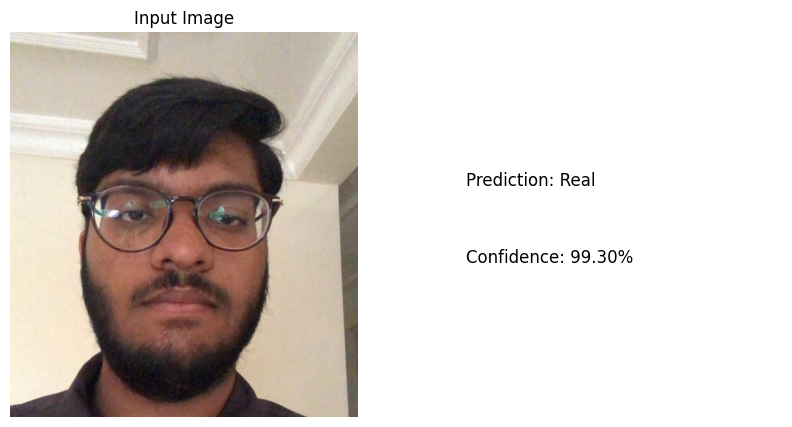

In [ ]:
# Load saved processor and model
from transformers import ViTImageProcessor, ViTForImageClassification
import matplotlib.pyplot as plt
import torch

# Load processor and model from disk
image_processor = ViTImageProcessor.from_pretrained("./vit-face-spoofing-lightning")
model = ViTForImageClassification.from_pretrained("./vit-face-spoofing-lightning")
model.eval() # Set to evaluation mode

# Helper function for inference
def detect_and_plot(image_path):
    """
    Detect if image is real or spoof
    Args:
        image_path: Path to image file
    Returns:
        prediction: 0 for real, 1 for spoof
        confidence: Confidence score
    """
    # Load and process image
    from PIL import Image
    image = Image.open(image_path)
    inputs = image_processor(image, return_tensors="pt")
    with torch.no_grad():
        outputs = model(**inputs)
        probs = torch.nn.functional.softmax(outputs.logits, dim=-1)
        prediction = torch.argmax(probs).item()
        confidence = probs[0][prediction].item()

    # Plot
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.axis('off')
    plt.title('Input Image')

    # Create text display
    plt.subplot(1, 2, 2)
    plt.text(0.1, 0.6, f"Prediction: {'Spoof' if prediction else 'Real'}", fontsize=12)
    plt.text(0.1, 0.4, f"Confidence: {confidence:.2%}", fontsize=12)
    plt.axis('off')
    plt.show()

# Example usage:
detect_and_plot("real.jpg")

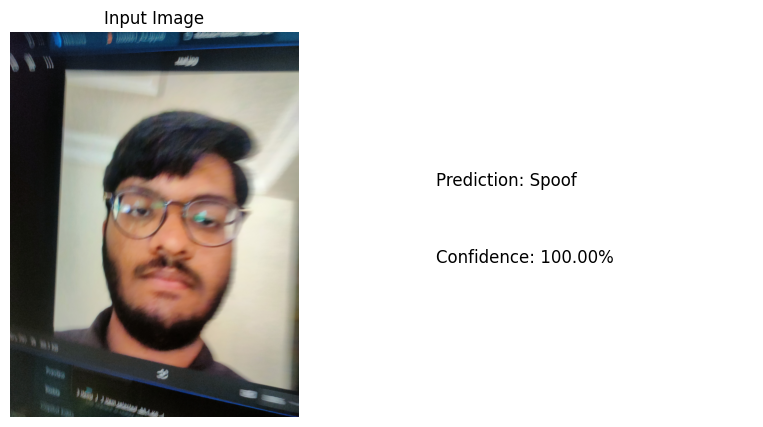

In [ ]:
detect_and_plot('spoofed.jpg')

# Part 2: AI-Powered Visual Search

Download and prepare dataset

In [ ]:
!pip install -q wget
import os
import json
import wget
import zipfile
from PIL import Image

# Create directories if they don't exist
os.makedirs('coco', exist_ok=True)

# Download COCO validation images and annotations
def download_coco_data():
    print("Downloading COCO validation images...")
    wget.download('http://images.cocodataset.org/zips/val2017.zip', 'coco/val2017.zip')

    print("\nDownloading COCO annotations...")
    wget.download('http://images.cocodataset.org/annotations/annotations_trainval2017.zip',
                 'coco/annotations_trainval2017.zip')

    # Extract the files
    print("\nExtracting validation images...")
    with zipfile.ZipFile('coco/val2017.zip', 'r') as zip_ref:
        zip_ref.extractall('coco')

    print("Extracting annotations...")
    with zipfile.ZipFile('coco/annotations_trainval2017.zip', 'r') as zip_ref:
        zip_ref.extractall('coco')

# Load COCO dataset
def load_coco_dataset(num_images=1000):  # Limit to 1000 images for faster processing
    # Load annotations
    with open('coco/annotations/instances_val2017.json', 'r') as f:
        annotations = json.load(f)

    dataset = []
    for img_info in annotations['images'][:num_images]:
        image_path = f"coco/val2017/{img_info['file_name']}"
        try:
            image = Image.open(image_path).convert('RGB')
            dataset.append({
                'image': image,
                'id': img_info['id'],
                'file_name': img_info['file_name']
            })
        except Exception as e:
            print(f"Error loading image {image_path}: {e}")

    return dataset

# Download and prepare the dataset
if not os.path.exists('coco/val2017'):
    download_coco_data()

# Load the dataset
print("Loading COCO dataset...")
coco_dataset = load_coco_dataset()
print(f"Loaded {len(coco_dataset)} images")

  Preparing metadata (setup.py) ... done


Extracting validation images...
Extracting annotations...
Loading COCO dataset...
Loaded 1000 images


Encode images

In [ ]:
import torch
from transformers import CLIPProcessor, CLIPModel
from PIL import Image
from tqdm import tqdm
import numpy as np

import matplotlib.pyplot as plt

# Load CLIP model and processor
model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

def encode_images(dataset, batch_size=32):
    image_features_list = []

    for i in tqdm(range(0, len(dataset), batch_size)):
        batch = dataset[i:i + batch_size]
        images = [item['image'] for item in batch]
        inputs = processor(images=images, return_tensors="pt", padding=True)

        with torch.no_grad():
            image_features = model.get_image_features(**inputs)
            image_features = image_features / image_features.norm(dim=-1, keepdim=True)
            image_features_list.append(image_features)

    return torch.cat(image_features_list)

def search_images(query, image_features, dataset, top_k=5):
    # Encode text
    inputs = processor(text=[query], return_tensors="pt", padding=True)
    with torch.no_grad():
        text_features = model.get_text_features(**inputs)
        text_features = text_features / text_features.norm(dim=-1, keepdim=True)

    # Calculate similarities
    similarity = (100.0 * image_features @ text_features.T).squeeze()
    values, indices = similarity.topk(top_k)

    return values.tolist(), [dataset[idx] for idx in indices]

# Encode all images in the dataset
print("Encoding COCO validation images...")
image_features = encode_images(coco_dataset)

def plot_results(query, images, similarities):
    plt.figure(figsize=(20, 4))
    plt.suptitle(f'Top 5 images for query: "{query}"', fontsize=16)

    for idx, (image, sim) in enumerate(zip(images, similarities)):
        plt.subplot(1, 5, idx + 1)
        plt.imshow(image['image'])
        plt.axis('off')
        plt.title(f'Sim: {sim:.4f}')

    plt.tight_layout()
    plt.show()

config.json:   0%|          | 0.00/4.19k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/605M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/862k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.22M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

Encoding COCO validation images...


100%|██████████| 32/32 [01:48<00:00,  3.39s/it]



Searching for: A person riding a horse


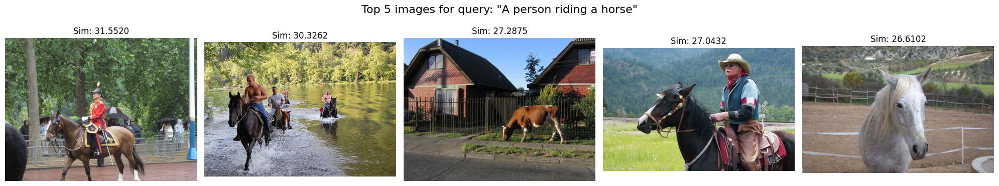


Searching for: A dog playing in the snow


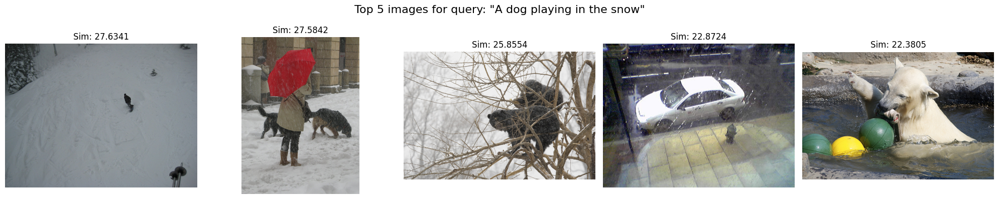


Searching for: A pizza on a table


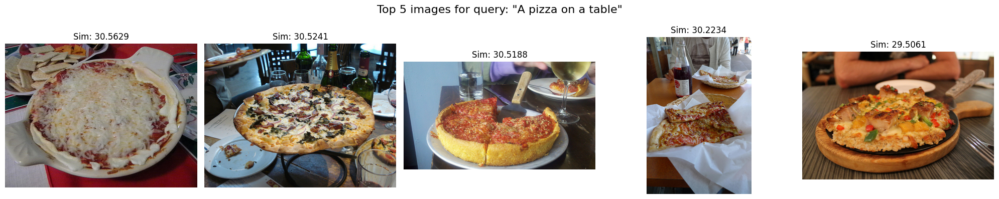


Searching for: People playing basketball


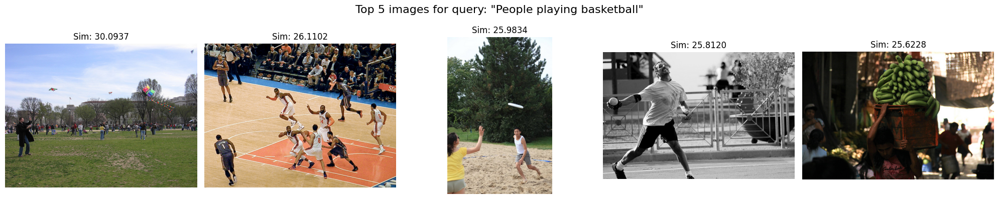


Searching for: A cat sleeping on a couch


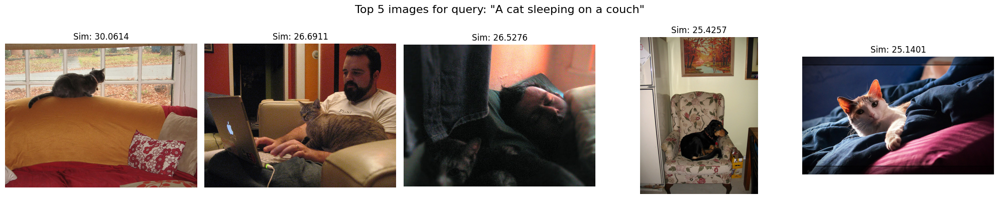

In [ ]:
# Example queries to test the image retrieval system
queries = [
    "A person riding a horse",
    "A dog playing in the snow",
    "A pizza on a table",
    "People playing basketball",
    "A cat sleeping on a couch"
]

# Test each query and display results
for query in queries:
    print(f"\nSearching for: {query}")
    similarities, retrieved_images = search_images(query, image_features, coco_dataset)
    plot_results(query, retrieved_images, similarities)

# Part 3: Stable Diffusion

In [2]:
!pip install -U -q --upgrade diffusers[torch]
# !pip install --upgrade sympy # restart kernel if prompted

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 37.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 22.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 36.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 14.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 93.1 MB/s eta 0:00:00


The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.72k [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

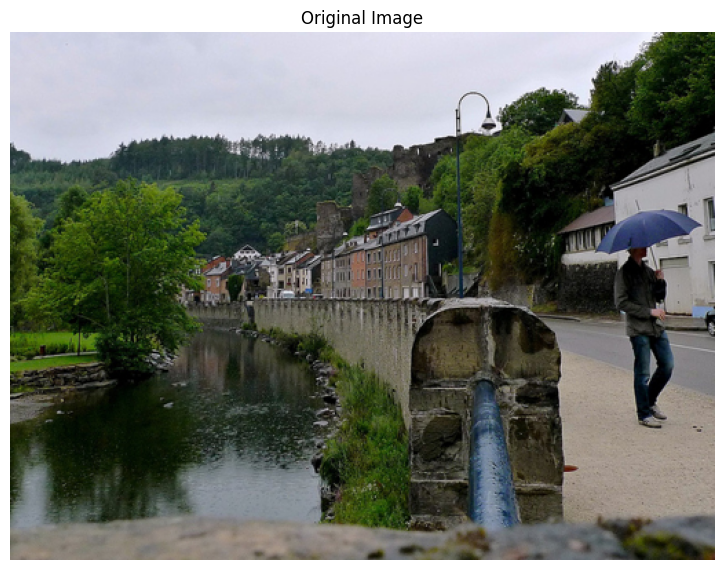

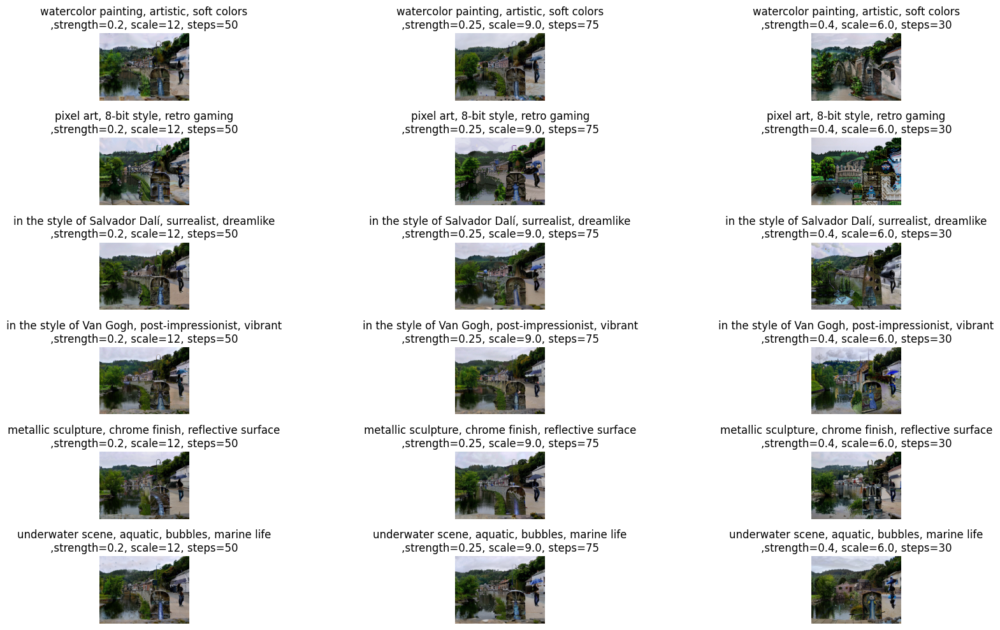

In [3]:
from diffusers import StableDiffusionImg2ImgPipeline
import torch
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import random

# Load the Stable Diffusion pipeline
pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    torch_dtype=torch.float16,
).to("cuda")

# Enable attention slicing for lower memory usage
pipe.enable_attention_slicing()

def resize_image(image, target_size):
    """Resize image while maintaining aspect ratio."""
    width, height = image.size
    aspect_ratio = width / height
    if aspect_ratio > 1:
        new_width = target_size
        new_height = int(target_size / aspect_ratio)
    else:
        new_height = target_size
        new_width = int(target_size * aspect_ratio)
    image = image.resize((new_width, new_height))
    return image

def generate_variations(image, prompts, parameter_sets):
    results = {}
    for params in parameter_sets:
        strength = params.get("strength", 0.75)
        guidance_scale = params.get("guidance_scale", 7.5)
        num_inference_steps = params.get("num_inference_steps", 50)
        with torch.autocast("cuda"):
            for prompt in prompts:
                # Generate image
                result = pipe(
                    prompt=prompt,
                    image=image,
                    strength=strength,
                    guidance_scale=guidance_scale,
                    num_inference_steps=num_inference_steps
                ).images[0]
                if prompt not in results:
                    results[prompt] = {}
                results[prompt][f",strength={strength}, scale={guidance_scale}, steps={num_inference_steps}"] = result
    return results

# Define different parameter sets for experimentation
parameter_sets = [
    {"strength": 0.2, "guidance_scale": 12, "num_inference_steps": 50}, # this one start with a lower strength value to preserve the original image's content and adjust the guidance scale to achieve the desired stylistic effect
    {"strength": 0.25, "guidance_scale": 9.0, "num_inference_steps": 75},
    {"strength": 0.4, "guidance_scale": 6.0, "num_inference_steps": 30}
]

# Define prompts
prompts = [
    "watercolor painting, artistic, soft colors",
    "pixel art, 8-bit style, retro gaming",
    "in the style of Salvador Dalí, surrealist, dreamlike",
    "in the style of Van Gogh, post-impressionist, vibrant",
    "metallic sculpture, chrome finish, reflective surface",
    "underwater scene, aquatic, bubbles, marine life"
]

# Select a random image from the COCO dataset as an example
# Assuming coco_dataset is a predefined list of images
pic_index = random.randint(0, len(coco_dataset) - 1)
input_image = coco_dataset[pic_index]['image']

# Resize the input image while maintaining aspect ratio
input_image = resize_image(input_image, 512)

# Generate variations with different parameters
variations = generate_variations(input_image, prompts, parameter_sets)

# Display the original image
plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.imshow(input_image)
plt.title("Original Image")
plt.axis('off')

# Display parameter variations
plt.figure(figsize=(20, 10))
for idx, (prompt, param_images) in enumerate(variations.items()):
    for sub_idx, (params, img) in enumerate(param_images.items()):
        plt.subplot(len(variations), len(parameter_sets), idx * len(parameter_sets) + sub_idx + 1)
        plt.imshow(img)
        plt.title(f"{prompt}\n{params}")
        plt.axis('off')
plt.tight_layout()
plt.show()

# Save generated images
output_dir = "generated_images"
os.makedirs(output_dir, exist_ok=True)
for prompt, param_images in variations.items():
    for params, img in param_images.items():
        prompt_filename = f"{prompt.split(',')[0].lower().replace(' ', '_')}_{params.replace(' ', '').replace('=', '').replace(',', '')}.png"
        img.save(os.path.join(output_dir, prompt_filename))


In [4]:
# save generated images
!zip -r generated_images.zip generated_images

  adding: generated_images/ (stored 0%)
  adding: generated_images/pixel_art_strength0.4scale6.0steps30.png (deflated 0%)
  adding: generated_images/in_the_style_of_salvador_dalí_strength0.2scale12steps50.png (deflated 0%)
  adding: generated_images/underwater_scene_strength0.4scale6.0steps30.png (deflated 0%)
  adding: generated_images/pixel_art_strength0.25scale9.0steps75.png (deflated 0%)
  adding: generated_images/pixel_art_strength0.2scale12steps50.png (deflated 0%)
  adding: generated_images/in_the_style_of_van_gogh_strength0.2scale12steps50.png (deflated 0%)
  adding: generated_images/in_the_style_of_van_gogh_strength0.4scale6.0steps30.png (deflated 0%)
  adding: generated_images/in_the_style_of_van_gogh_strength0.25scale9.0steps75.png (deflated 0%)
  adding: generated_images/in_the_style_of_salvador_dalí_strength0.25scale9.0steps75.png (deflated 0%)
  adding: generated_images/metallic_sculpture_strength0.4scale6.0steps30.png (deflated 0%)
  adding: generated_images/metallic_scu

# Part 4: Mockup Generation -- skipped

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

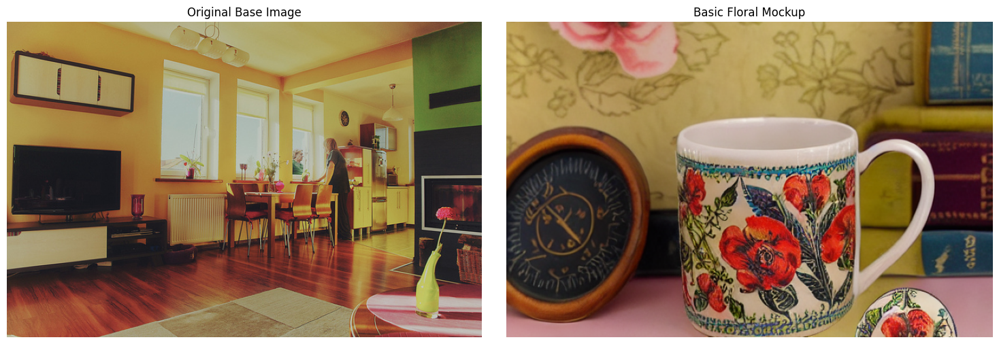

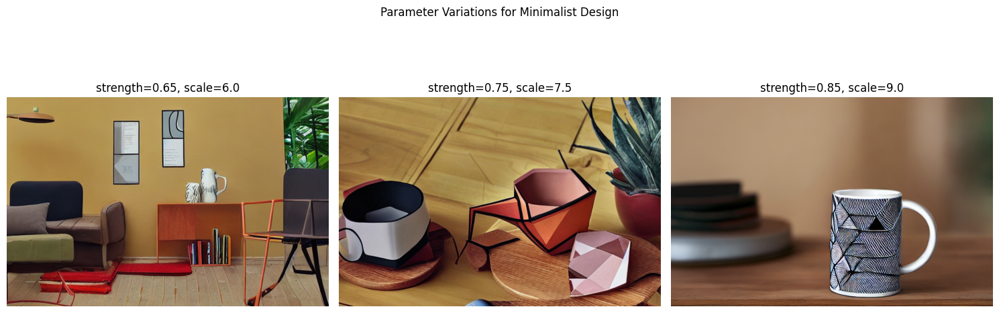

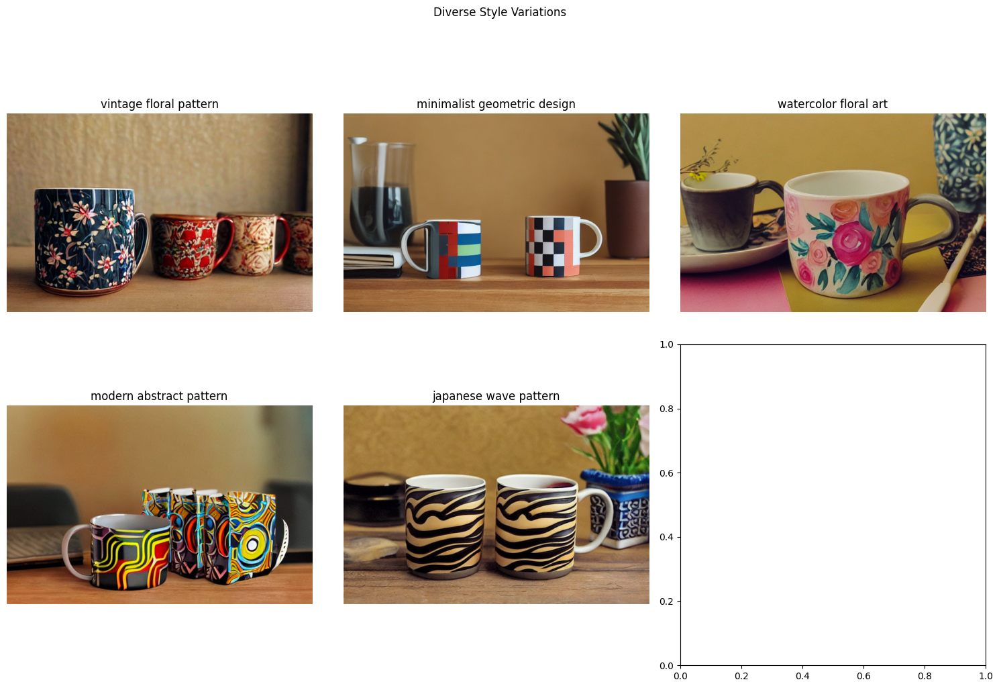

In [ ]:
from PIL import Image

import matplotlib.pyplot as plt

# Load a base white mug image (you should replace this with your actual mug image path)
sample = "coco/val2017/000000000139.jpg"  # Using first COCO image as example
base_sample = Image.open(sample).convert('RGB')

# Define style prompts for product customization
product_styles = [
    "vintage floral pattern, decorative, elegant",
    "minimalist geometric design, clean lines",
    "watercolor floral art, soft pastel colors",
    "modern abstract pattern, bold colors",
    "japanese wave pattern, traditional art"
]

# Parameter variations for minimalist design
minimalist_parameters = [
    {"strength": 0.65, "guidance_scale": 6.0, "num_inference_steps": 50},
    {"strength": 0.75, "guidance_scale": 7.5, "num_inference_steps": 50},
    {"strength": 0.85, "guidance_scale": 9.0, "num_inference_steps": 50}
]

# Generate basic mockup with vintage floral pattern
basic_mockup = generate_variations(
    base_sample,
    ["vintage floral pattern, decorative design on a mug"],
    strength=0.75,
    guidance_scale=7.5
)

# Generate parameter variations for minimalist design
minimalist_variations = {}
for params in minimalist_parameters:
    result = generate_variations(
        base_sample,
        ["minimalist geometric design on a mug"],
        **params
    )
    minimalist_variations[f"strength={params['strength']}, scale={params['guidance_scale']}"] = \
        result["minimalist geometric design on a mug"]

# Generate diverse style variations
style_variations = generate_variations(base_sample,
    [style + " on a mug" for style in product_styles])

# Display results
plt.figure(figsize=(15, 5))

# Show original and basic mockup
plt.subplot(1, 2, 1)
plt.imshow(base_sample)
plt.title("Original Base Image")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(list(basic_mockup.values())[0])
plt.title("Basic Floral Mockup")
plt.axis('off')

plt.tight_layout()
plt.show()

# Display parameter variations
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
for idx, (params, img) in enumerate(minimalist_variations.items()):
    axes[idx].imshow(img)
    axes[idx].set_title(params)
    axes[idx].axis('off')
plt.suptitle("Parameter Variations for Minimalist Design", y=1.05)
plt.tight_layout()
plt.show()

# Display style variations
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
for idx, (style, img) in enumerate(style_variations.items()):
    row = idx // 3
    col = idx % 3
    if idx < len(style_variations):
        axes[row, col].imshow(img)
        axes[row, col].set_title(style.split(',')[0])
        axes[row, col].axis('off')
plt.suptitle("Diverse Style Variations", y=1.02)
plt.tight_layout()
plt.show()